# Supplemental InstanSeg marker-set comparison

Use this notebook to compare two channel/marker sets on the same image crop with
identical InstanSeg and watershed settings. The default comparison is the current
11-marker input versus a reduced 5-marker input. Edit only INPUT_CHANNEL_SETS to
test another pair.

This notebook is diagnostic and does not change production artifacts.


## 1. Imports and environment

In [1]:
from pathlib import Path
import re, sys, time

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import ndimage as ndi
from skimage.segmentation import find_boundaries, watershed
import tifffile
import torch

REPO_ROOT = Path.cwd().resolve()
if not (REPO_ROOT / 'pyproject.toml').exists():
    REPO_ROOT = REPO_ROOT.parent
sys.path.insert(0, str(REPO_ROOT / 'src'))

from mif_pipeline.instanseg_runner import (
    _coerce_instances_array, _import_instanseg, _upscale_label_image,
)

ARTIFACT_DIR = REPO_ROOT / 'experimental_data/instanseg_watershed_reconciliation'
print(sys.executable)
print('CUDA available:', torch.cuda.is_available())
print('artifacts:', ARTIFACT_DIR)


/data1/lowes/ratnayn/conda_envs/instanseg_nimbus/bin/python
CUDA available: True
artifacts: /data1/lowes/ratnayn/Codex/projects/mIF-pipeline/experimental_data/instanseg_watershed_reconciliation


## 2. Choose the two marker sets

Keep the order meaningful and use channel names present in the saved crop.
The reduced default retains nuclear, epithelial, immune, membrane, and endothelial
context. This is a practical comparison, not a claim that these five are optimal.


In [2]:
INSTANSEG_MODEL = 'fluorescence_nuclei_and_cells'
INSTANSEG_EVAL_SETTINGS = {
    'pixel_size': 0.325,
    'tile_size': 2000,
    'batch_size': 10,
    'normalise': True,
    'normalisation_subsampling_factor': 1,
    'rescale_output': True,
    'min_size': 10,
    'mask_threshold': 0.53,
    'peak_distance': 5,
    'seed_threshold': 0.7,
    'overlap_threshold': 0.3,
    'mean_threshold': 0.0,
    'fg_threshold': 0.5,
    'window_size': 32,
    'cleanup_fragments': True,
}

INPUT_CHANNEL_SETS = {
    'all_11_markers': [
        'R1_DAPI',
        'R4_P19_POLYRAT',
        'R4_GFP_POLY_AF488',
        'R6_CD45_CST_AF647',
        'R6_PANCK_AE1_AE3_750',
        'R12_CD31_D8V9E_AF750',
        'R7_NAK_ATPASE_555',
        #'R8_PODOPLANIN_750',
        'R8_F480_D2S9R_555',
        'R9_CD68_E3O7V_488',
        'R12_CD3E_E4T1B_AF555',
    ],
    'reduced_5_markers': [
        'R1_DAPI',
        'R4_P19_POLYRAT',
        'R4_GFP_POLY_AF488',
        'R6_CD45_CST_AF647',
        'R6_PANCK_AE1_AE3_750',
        'R12_CD31_D8V9E_AF750',
        'R7_NAK_ATPASE_555',

    ],
}
assert len(INPUT_CHANNEL_SETS) == 2, 'Define exactly two marker sets for this notebook.'
for set_name, channel_names in INPUT_CHANNEL_SETS.items():
    print(f'{set_name} ({len(channel_names)}):')
    for name in channel_names:
        print('  ', name)


all_11_markers (10):
   R1_DAPI
   R4_P19_POLYRAT
   R4_GFP_POLY_AF488
   R6_CD45_CST_AF647
   R6_PANCK_AE1_AE3_750
   R12_CD31_D8V9E_AF750
   R7_NAK_ATPASE_555
   R8_F480_D2S9R_555
   R9_CD68_E3O7V_488
   R12_CD3E_E4T1B_AF555
reduced_5_markers (7):
   R1_DAPI
   R4_P19_POLYRAT
   R4_GFP_POLY_AF488
   R6_CD45_CST_AF647
   R6_PANCK_AE1_AE3_750
   R12_CD31_D8V9E_AF750
   R7_NAK_ATPASE_555


## 3. Load the common crop and morphology view

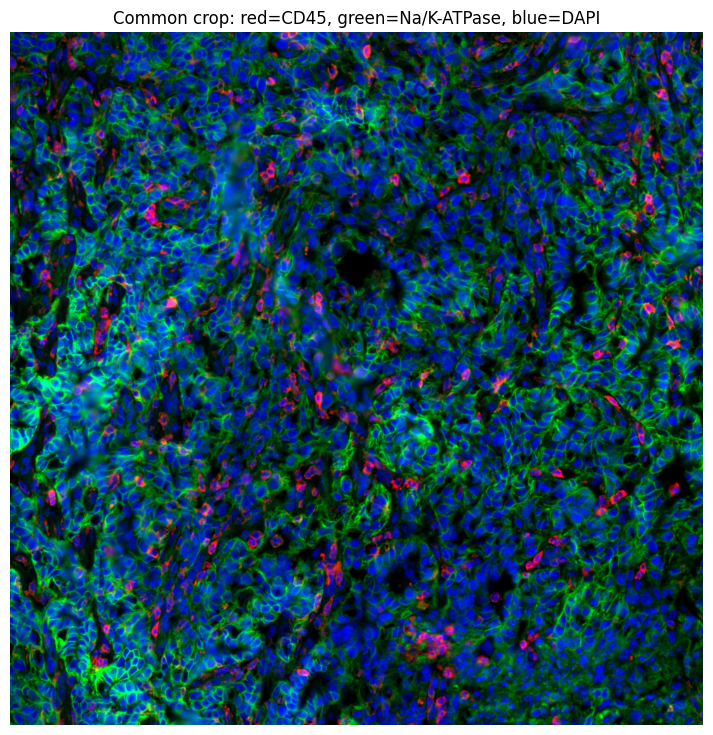

crop: /data1/lowes/ratnayn/Codex/projects/mIF-pipeline/experimental_data/instanseg_watershed_reconciliation/SLIDE-0330_C2_A_1L_x24618_y40257_w2048_h2048_instanseg11ch_ebc14fe0.ome.tif
available channels: ['R1_DAPI', 'R4_P19_POLYRAT', 'R4_GFP_POLY_AF488', 'R6_CD45_CST_AF647', 'R6_PANCK_AE1_AE3_750', 'R12_CD31_D8V9E_AF750', 'R7_NAK_ATPASE_555', 'R8_PODOPLANIN_750', 'R8_F480_D2S9R_555', 'R9_CD68_E3O7V_488', 'R12_CD3E_E4T1B_AF555']


In [3]:
existing_crops = sorted(ARTIFACT_DIR.glob(
    'SLIDE-0330_C2_A_1L_x24618_y40257_w2048_h2048_instanseg11ch_*.ome.tif'
))
if not existing_crops:
    raise FileNotFoundError(f'No existing 11-channel test crop found in {ARTIFACT_DIR}')
TEST_CROP_OME = existing_crops[-1]

def channel_names_from_ome_xml(ome_xml):
    return re.findall(r'<Channel[^>]*Name="([^"]+)"', ome_xml or '')

def robust01(image, percentiles=(1, 99.8)):
    lo, hi = np.percentile(image, percentiles)
    return np.clip((image.astype(np.float32) - lo) / max(float(hi - lo), 1e-6), 0, 1)

with tifffile.TiffFile(TEST_CROP_OME) as tf:
    crop_names = channel_names_from_ome_xml(tf.ome_metadata)
    channel_to_index = {name: index for index, name in enumerate(crop_names)}
    requested = sorted({name for names in INPUT_CHANNEL_SETS.values() for name in names})
    missing = [name for name in requested if name not in channel_to_index]
    if missing:
        raise ValueError(f'Channels absent from the saved crop: {missing}')
    image_by_channel = {
        name: tf.series[0].pages[channel_to_index[name]].asarray().astype(np.float32)
        for name in requested
    }

morphology_rgb = np.stack([
    robust01(image_by_channel['R6_CD45_CST_AF647']),
    robust01(image_by_channel['R7_NAK_ATPASE_555']),
    robust01(image_by_channel['R1_DAPI']),
], axis=-1) ** 0.7

plt.figure(figsize=(9, 9))
plt.imshow(morphology_rgb)
plt.title('Common crop: red=CD45, green=Na/K-ATPase, blue=DAPI')
plt.axis('off')
plt.show()
print('crop:', TEST_CROP_OME)
print('available channels:', crop_names)


## 4. Shared inference and watershed helpers

In [4]:
def planes_at_crop_resolution(instances, output_shape):
    planes = []
    for plane in instances:
        planes.append(
            plane.astype(np.uint32, copy=False)
            if plane.shape == tuple(output_shape)
            else _upscale_label_image(plane, output_shape)
        )
    return np.stack(planes)

def associate_nuclei_to_cells(cell_labels, nucleus_labels, min_overlap_fraction=0.5):
    both = (cell_labels > 0) & (nucleus_labels > 0)
    cell_ids = cell_labels[both].astype(np.int64, copy=False)
    nucleus_ids = nucleus_labels[both].astype(np.int64, copy=False)
    pair_shape = (int(cell_labels.max()) + 1, int(nucleus_labels.max()) + 1)
    pair_codes = np.ravel_multi_index((cell_ids, nucleus_ids), pair_shape)
    unique_codes, overlap_pixels = np.unique(pair_codes, return_counts=True)
    pair_cell_ids, pair_nucleus_ids = np.unravel_index(unique_codes, pair_shape)
    positive_nuclei = nucleus_labels[nucleus_labels > 0]
    ids, areas = np.unique(positive_nuclei, return_counts=True)
    area_by_id = pd.Series(areas, index=ids)
    table = pd.DataFrame({
        'cell_id': pair_cell_ids.astype(np.uint32),
        'nucleus_id': pair_nucleus_ids.astype(np.uint32),
        'overlap_pixels': overlap_pixels,
    })
    table['nucleus_area'] = table['nucleus_id'].map(area_by_id).astype(np.int64)
    table['overlap_fraction'] = table['overlap_pixels'] / table['nucleus_area']
    return table.loc[table['overlap_fraction'] > min_overlap_fraction].copy()

def combine_slices(slices, margin, shape):
    y0 = max(0, min(s[0].start for s in slices) - margin)
    y1 = min(shape[0], max(s[0].stop for s in slices) + margin)
    x0 = max(0, min(s[1].start for s in slices) - margin)
    x1 = min(shape[1], max(s[1].stop for s in slices) + margin)
    return slice(y0, y1), slice(x0, x1)

def apply_local_watershed(raw_cells, raw_nuclei, qualifying_pairs):
    raw_cell_ids = np.unique(raw_cells[raw_cells > 0]).astype(np.uint32)
    qualifying_by_cell = {
        int(cell_id): group['nucleus_id'].astype(int).tolist()
        for cell_id, group in qualifying_pairs.groupby('cell_id', sort=True)
    }
    cell_slices = ndi.find_objects(raw_cells)
    nucleus_slices = ndi.find_objects(raw_nuclei)
    output = raw_cells.copy()
    next_cell_id = int(raw_cells.max()) + 1
    nucleus_to_final_cell = {}
    records = []

    for cell_id in raw_cell_ids.astype(int):
        associated = qualifying_by_cell.get(cell_id, [])
        if len(associated) == 1:
            nucleus_to_final_cell[associated[0]] = cell_id
        elif len(associated) > 1:
            object_slices = [cell_slices[cell_id - 1]] + [
                nucleus_slices[nucleus_id - 1] for nucleus_id in associated
            ]
            assert all(item is not None for item in object_slices)
            bbox = combine_slices(object_slices, margin=8, shape=raw_cells.shape)
            cell_crop, nucleus_crop = raw_cells[bbox], raw_nuclei[bbox]
            territory = cell_crop == cell_id
            markers = np.zeros(territory.shape, dtype=np.int32)
            for marker_id, nucleus_id in enumerate(associated, start=1):
                nucleus_mask = nucleus_crop == nucleus_id
                territory |= nucleus_mask
                markers[nucleus_mask] = marker_id
            split = watershed(
                -ndi.distance_transform_edt(territory),
                markers=markers,
                mask=territory,
            )
            daughter_ids = [cell_id] + list(
                range(next_cell_id, next_cell_id + len(associated) - 1)
            )
            next_cell_id += len(associated) - 1
            local_output = output[bbox]
            parent_pixels = cell_crop == cell_id
            local_output[parent_pixels] = 0
            for marker_id, (nucleus_id, daughter_id) in enumerate(
                zip(associated, daughter_ids), start=1
            ):
                local_output[(split == marker_id) & parent_pixels] = daughter_id
                nucleus_to_final_cell[nucleus_id] = daughter_id
            output[bbox] = local_output
            records.append({
                'parent_cell_id': cell_id,
                'n_nuclei': len(associated),
                'n_daughters': len(daughter_ids),
            })

    for nucleus_id, final_cell_id in nucleus_to_final_cell.items():
        output[raw_nuclei == nucleus_id] = final_cell_id
    return output, pd.DataFrame(records)

def count_instances(labels):
    return int(np.unique(labels[labels > 0]).size)

def count_holes(labels):
    holes = 0
    hole_pixels = 0
    for label_id, bbox in enumerate(ndi.find_objects(labels), start=1):
        if bbox is None:
            continue
        local = labels[bbox]
        mask = local == label_id
        local_holes = ndi.binary_fill_holes(mask) & (local == 0)
        labeled_holes, n_holes = ndi.label(local_holes)
        holes += int(n_holes)
        hole_pixels += int((labeled_holes > 0).sum())
    return holes, hole_pixels

def overlay_boundaries(ax, image, labels, color, title):
    ax.imshow(image, interpolation='nearest')
    boundary = find_boundaries(labels, mode='outer')
    rgba = np.zeros((*boundary.shape, 4), dtype=float)
    rgba[boundary] = (*plt.matplotlib.colors.to_rgb(color), 1.0)
    ax.imshow(rgba, interpolation='nearest')
    ax.set_title(title)
    ax.axis('off')


## 5. Run both marker sets

Each set is evaluated independently with the same fixed settings. Both native
resolved and unresolved masks are retained; watershed uses the unresolved masks.


In [5]:
InstanSeg = _import_instanseg()
inst = InstanSeg(INSTANSEG_MODEL, verbosity=1)
eval_kwargs = dict(INSTANSEG_EVAL_SETTINGS, return_image_tensor=False)
results = {}

for set_name, channel_names in INPUT_CHANNEL_SETS.items():
    inference_image = np.stack([image_by_channel[name] for name in channel_names])
    print(f'\nRunning {set_name}: {inference_image.shape}')
    started = time.time()
    raw = planes_at_crop_resolution(
        _coerce_instances_array(inst.eval_medium_image(
            inference_image, resolve_cell_and_nucleus=False, **eval_kwargs
        )),
        inference_image.shape[-2:],
    )
    native = planes_at_crop_resolution(
        _coerce_instances_array(inst.eval_medium_image(
            inference_image, resolve_cell_and_nucleus=True, **eval_kwargs
        )),
        inference_image.shape[-2:],
    )
    raw_nuclei, raw_cells = raw[0], raw[1]
    qualifying_pairs = associate_nuclei_to_cells(raw_cells, raw_nuclei)
    watershed_cells, watershed_records = apply_local_watershed(
        raw_cells, raw_nuclei, qualifying_pairs
    )
    results[set_name] = {
        'channels': channel_names,
        'raw_nuclei': raw_nuclei,
        'raw_cells': raw_cells,
        'native_nuclei': native[0],
        'native_cells': native[1],
        'watershed_cells': watershed_cells,
        'watershed_records': watershed_records,
        'runtime_seconds': time.time() - started,
    }
    print(f'finished {set_name} in {results[set_name]["runtime_seconds"]:.1f}s')


Model fluorescence_nuclei_and_cells version 0.1.1 already downloaded in /data1/lowes/ratnayn/conda_envs/instanseg_nimbus/lib/python3.10/site-packages/instanseg/utils/../bioimageio_models/, loading
Requesting default device: cuda

Running all_11_markers: (10, 2048, 2048)


                                             1.74s/it]

finished all_11_markers in 8.8s

Running reduced_5_markers: (7, 2048, 2048)


                                             2.12it/s]

finished reduced_5_markers in 6.7s


## 6. Quantitative comparison

In [6]:
summary_rows = []
for set_name, result in results.items():
    raw_holes, raw_hole_pixels = count_holes(result['raw_cells'])
    native_holes, native_hole_pixels = count_holes(result['native_cells'])
    ws_holes, ws_hole_pixels = count_holes(result['watershed_cells'])
    summary_rows.append({
        'marker_set': set_name,
        'n_channels': len(result['channels']),
        'raw_nuclei': count_instances(result['raw_nuclei']),
        'raw_cells': count_instances(result['raw_cells']),
        'native_cells': count_instances(result['native_cells']),
        'watershed_cells': count_instances(result['watershed_cells']),
        'watershed_parents_split': len(result['watershed_records']),
        'raw_holes': raw_holes,
        'raw_hole_pixels': raw_hole_pixels,
        'native_holes': native_holes,
        'native_hole_pixels': native_hole_pixels,
        'watershed_holes': ws_holes,
        'watershed_hole_pixels': ws_hole_pixels,
        'runtime_seconds': result['runtime_seconds'],
    })
summary = pd.DataFrame(summary_rows).set_index('marker_set')
display(summary)

set_a, set_b = list(results)
for mask_name in ['raw_nuclei', 'raw_cells', 'native_cells', 'watershed_cells']:
    foreground_a = results[set_a][mask_name] > 0
    foreground_b = results[set_b][mask_name] > 0
    intersection = np.count_nonzero(foreground_a & foreground_b)
    union = np.count_nonzero(foreground_a | foreground_b)
    print(f'{mask_name} foreground IoU: {intersection / max(union, 1):.4f}')


,n_channels,raw_nuclei,raw_cells,native_cells,watershed_cells,watershed_parents_split,raw_holes,raw_hole_pixels,native_holes,native_hole_pixels,watershed_holes,watershed_hole_pixels,runtime_seconds
marker_set,,,,,,,,,,,,,
all_11_markers,10,4292,4439,4942,4599,153,9,28,10,30,7,20,8.806324
reduced_5_markers,7,4332,4460,4965,4643,173,5,7,4,5,2,3,6.663784


raw_nuclei foreground IoU: 0.8641
raw_cells foreground IoU: 0.8822
native_cells foreground IoU: 0.8947
watershed_cells foreground IoU: 0.8855


## 7. Side-by-side segmentation and watershed views

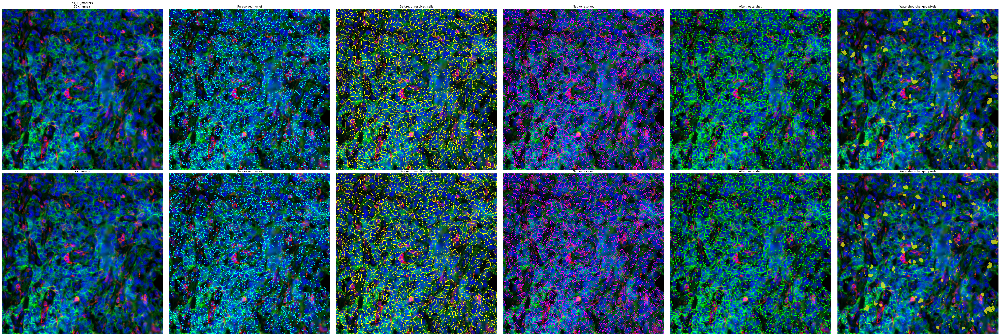

In [9]:
view = (slice(0, morphology_rgb.shape[0] // 2), slice(0, morphology_rgb.shape[1] // 2))
image = morphology_rgb[view]
fig, axes = plt.subplots(len(results), 6, figsize=(60, 10 * len(results)), squeeze=False)
for row, (set_name, result) in enumerate(results.items()):
    axes[row, 0].imshow(image)
    axes[row, 0].set_title(f'{set_name}\n{len(result["channels"])} channels')
    axes[row, 0].axis('off')
    overlay_boundaries(axes[row, 1], image, result['raw_nuclei'][view], 'cyan', 'Unresolved nuclei')
    overlay_boundaries(axes[row, 2], image, result['raw_cells'][view], 'yellow', 'Before: unresolved cells')
    overlay_boundaries(axes[row, 3], image, result['native_cells'][view], 'magenta', 'Native resolved')
    overlay_boundaries(axes[row, 4], image, result['watershed_cells'][view], 'lime', 'After: watershed')
    changed = result['watershed_cells'][view] != result['raw_cells'][view]
    axes[row, 5].imshow(image)
    rgba = np.zeros((*changed.shape, 4), float)
    rgba[changed] = (1, 1, 0, 0.7)
    axes[row, 5].imshow(rgba)
    axes[row, 5].set_title('Watershed-changed pixels')
    axes[row, 5].axis('off')
plt.tight_layout()
plt.show()


## 8. Directly visualize where the two marker sets disagree

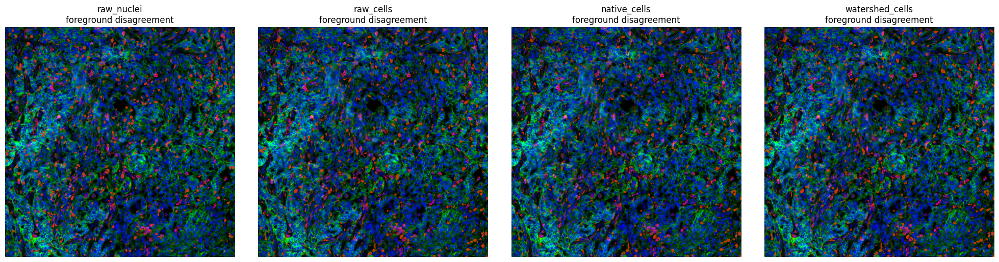

In [8]:
set_a, set_b = list(results)
fig, axes = plt.subplots(1, 4, figsize=(20, 5))
for ax, mask_name in zip(
    axes,
    ['raw_nuclei', 'raw_cells', 'native_cells', 'watershed_cells'],
):
    foreground_a = results[set_a][mask_name] > 0
    foreground_b = results[set_b][mask_name] > 0
    disagreement = foreground_a ^ foreground_b
    ax.imshow(morphology_rgb)
    rgba = np.zeros((*disagreement.shape, 4), float)
    rgba[disagreement] = (1, 0.25, 0, 0.75)
    ax.imshow(rgba)
    ax.set_title(f'{mask_name}\nforeground disagreement')
    ax.axis('off')
plt.tight_layout()
plt.show()


## Interpretation notes

- Similar counts and high foreground IoU are reassuring but do not prove equivalent
  instance boundaries or biological performance.
- Inspect both global panels and local disagreements before removing markers.
- Repeat this comparison on multiple representative crops; one field is not enough
  to establish that a marker is unnecessary.
- Keep the fixed inference and watershed settings identical between channel sets.
